In [1]:
import mne as mne
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

eeg_a=mne.io.read_raw_brainvision("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/retino_gamma_02.vhdr",preload=True)
eeg_g=mne.io.read_raw_brainvision("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/retino_gamma_02.vhdr",preload=True)
eeg_r=mne.io.read_raw_brainvision("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/4 gamma.vhdr",preload=True)

Extracting parameters from C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/retino_gamma_02.vhdr...
Setting channel info structure...
Reading 0 ... 2594599  =      0.000 ...   518.920 secs...
Extracting parameters from C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/retino_gamma_02.vhdr...
Setting channel info structure...
Reading 0 ... 2579899  =      0.000 ...   515.980 secs...
Extracting parameters from C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/4 gamma.vhdr...
Setting channel info structure...
Reading 0 ... 2591999  =      0.000 ...   518.400 secs...


In [2]:
data_a=eeg_a.get_data() #raw data
events_a=mne.events_from_annotations(eeg_a) #evts changed to events

data_g=eeg_g.get_data() #raw data
events_g=mne.events_from_annotations(eeg_g) #evts changed to events

data_r=eeg_r.get_data() #raw data
events_r=mne.events_from_annotations(eeg_r) #evts changed to events

Used Annotations descriptions: ['New Segment/', 'Response/R128', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S 98', 'Stimulus/S 99', 'SyncStatus/Sync On']
Used Annotations descriptions: ['New Segment/', 'Response/R128', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S 98', 'Stimulus/S 99', 'SyncStatus/Sync On']
Used Annotations descriptions: ['New Segment/', 'Response/R128', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S 98', 'Stimulus/S 99', 'SyncStatus/Sync On']


In [3]:
vol_trigs_a=events_a[1]['Response/R128']
vol_inds_a=np.argwhere(events_a[0][:,2]==vol_trigs_a)
vol_times_a=events_a[0][vol_inds_a,0].astype(int) #these are times corresponding to those indices

vol_trigs_g=events_g[1]['Response/R128']
vol_inds_g=np.argwhere(events_g[0][:,2]==vol_trigs_g)
vol_times_g=events_g[0][vol_inds_g,0].astype(int) #these are times corresponding to those indices

vol_trigs_r=events_r[1]['Response/R128']
vol_inds_r=np.argwhere(events_r[0][:,2]==vol_trigs_r)
vol_times_r=events_r[0][vol_inds_r,0].astype(int) #these are times corresponding to those indices

In [4]:
#Step 2-Part B
#removing gradient artifact which is caused by scanner while ballistographic is caused by heartbeat
grad_len=3465
grad_epochs_a=np.reshape(data_a[:,vol_times_a[0,0]:vol_times_a[-2,0]+grad_len],[64,vol_times_a.shape[0]-1,grad_len])
grad_epochs_a.shape

grad_epochs_g=np.reshape(data_g[:,vol_times_g[0,0]:vol_times_g[-2,0]+grad_len],[64,vol_times_g.shape[0]-1,grad_len])
grad_epochs_g.shape

grad_epochs_r=np.reshape(data_r[:,vol_times_r[0,0]:vol_times_r[-2,0]+grad_len],[64,vol_times_r.shape[0]-1,grad_len])
grad_epochs_r.shape

(64, 734, 3465)

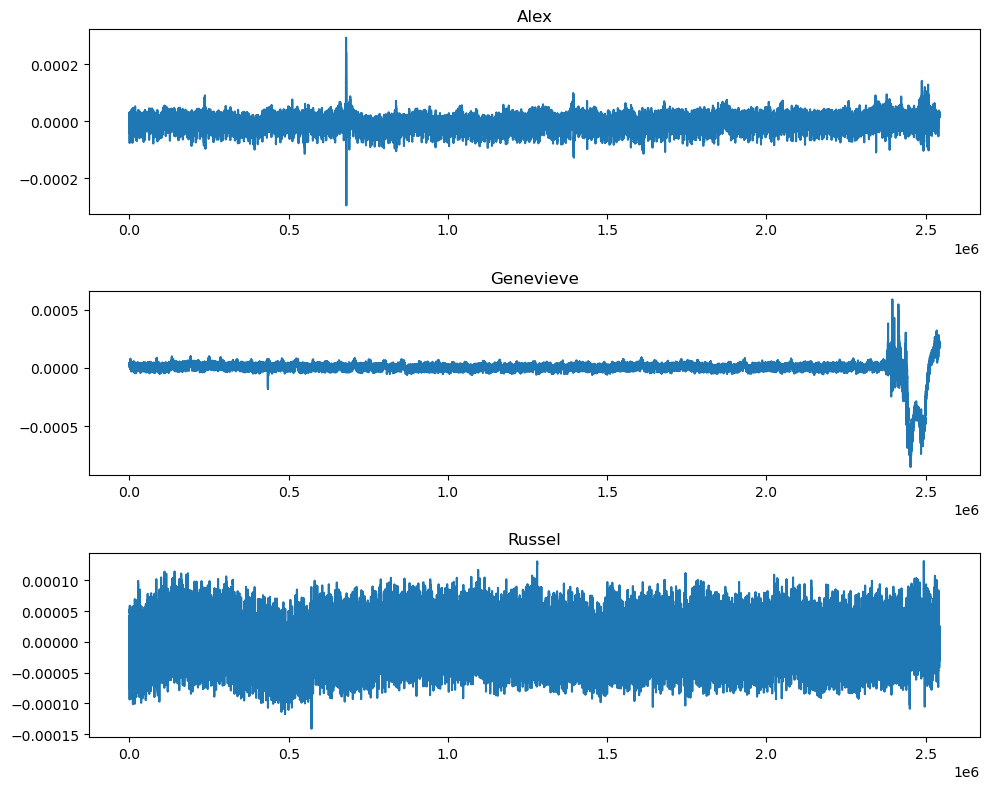

In [5]:
#subtracted equals
subbed_a=grad_epochs_a-np.expand_dims(np.mean(grad_epochs_a,axis=1),axis=1)
subbed_a.shape
subbed_a=np.reshape(subbed_a,data_a[:,vol_times_a[0,0]:vol_times_a[-2,0]+grad_len].shape)

subbed_g=grad_epochs_g-np.expand_dims(np.mean(grad_epochs_g,axis=1),axis=1)
subbed_g.shape
subbed_g=np.reshape(subbed_g,data_g[:,vol_times_g[0,0]:vol_times_g[-2,0]+grad_len].shape)

subbed_r=grad_epochs_r-np.expand_dims(np.mean(grad_epochs_r,axis=1),axis=1)
subbed_r.shape
subbed_r=np.reshape(subbed_r,data_r[:,vol_times_r[0,0]:vol_times_r[-2,0]+grad_len].shape)

fig,axes=plt.subplots(3,1,figsize=(10,8))
axes[0].plot(subbed_a[3,:])
axes[1].plot(subbed_g[3,:])
axes[2].plot(subbed_r[3,:])

axes[0].set_title("Alex")
axes[1].set_title("Genevieve")
axes[2].set_title("Russel")
plt.tight_layout()

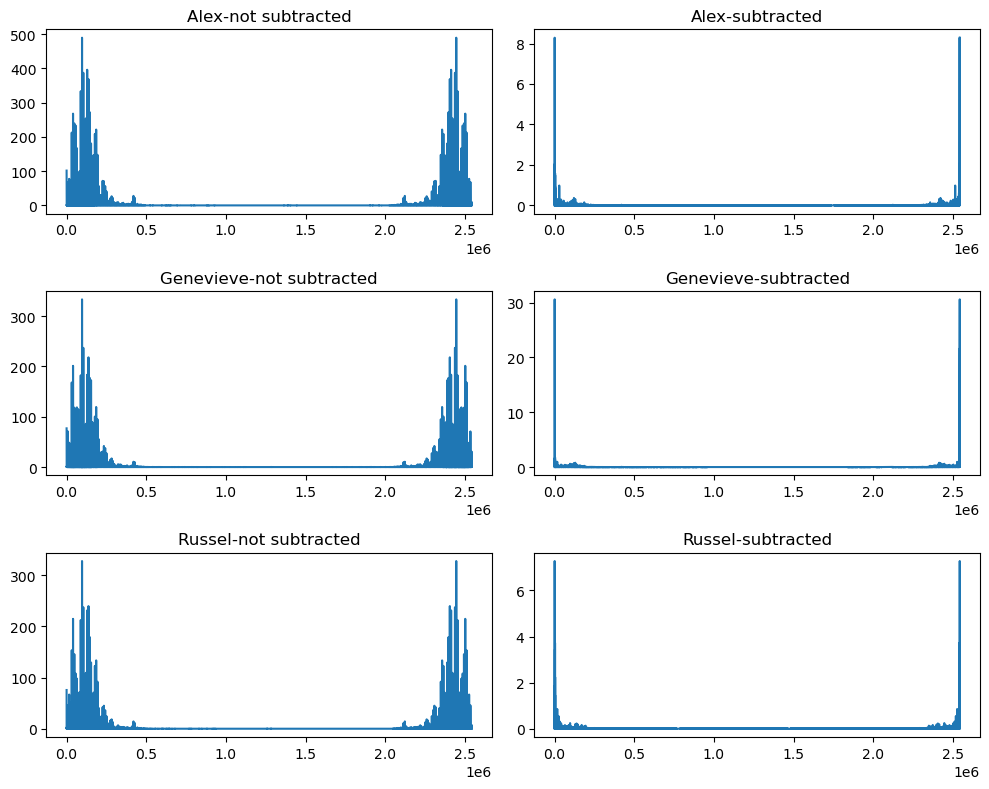

In [6]:
#plotting not subtracted and subtracted eeg
not_sub_a=np.abs(np.fft.fft(data_a[3,vol_times_a[0,0]:vol_times_a[-2,0]+grad_len]))
sub_a=np.abs(np.fft.fft(subbed_a[3,:]))

not_sub_g=np.abs(np.fft.fft(data_g[3,vol_times_g[0,0]:vol_times_g[-2,0]+grad_len]))
sub_g=np.abs(np.fft.fft(subbed_g[3,:]))

not_sub_r=np.abs(np.fft.fft(data_r[3,vol_times_r[0,0]:vol_times_r[-2,0]+grad_len]))
sub_r=np.abs(np.fft.fft(subbed_r[3,:]))

fig,axes=plt.subplots(3,2,figsize=(10,8))
axes[0][0].plot(not_sub_a); axes[0][1].plot(sub_a);
axes[1][0].plot(not_sub_g); axes[1][1].plot(sub_g);
axes[2][0].plot(not_sub_r); axes[2][1].plot(sub_r);

axes[0][0].set_title("Alex-not subtracted"); axes[0][1].set_title("Alex-subtracted")
axes[1][0].set_title("Genevieve-not subtracted"); axes[1][1].set_title("Genevieve-subtracted")
axes[2][0].set_title("Russel-not subtracted"); axes[2][1].set_title("Russel-subtracted")
plt.tight_layout()

In [7]:
#Step 2- Part B 
#BCG artifact removal
from scipy.signal import resample
from scipy.signal import find_peaks

#downsampling from 5000 Hz to 250 Hz
resamp_a=resample(subbed_a,int(subbed_a.shape[1]/(5000/250)),axis=1)
resamp_g=resample(subbed_g,int(subbed_g.shape[1]/(5000/250)),axis=1)
resamp_r=resample(subbed_r,int(subbed_r.shape[1]/(5000/250)),axis=1)

#Finding peaks
peaks_a=find_peaks(resamp_a[31,:],distance=180)
peaks_g=find_peaks(resamp_g[31,:],distance=180)
peaks_r=find_peaks(resamp_r[31,:],distance=180)

In [8]:
#epoch the data using peaks
eps_a=np.zeros([64,peaks_a[0].shape[0],210])
for i in np.arange(1,peaks_a[0].shape[0]-1):
    eps_a[:,i,:]=resamp_a[:,peaks_a[0][i]-105:peaks_a[0][i]+105]
    
eps_g=np.zeros([64,peaks_g[0].shape[0],210])
for i in np.arange(1,peaks_g[0].shape[0]-1):
    eps_g[:,i,:]=resamp_g[:,peaks_g[0][i]-105:peaks_g[0][i]+105]
    
eps_r=np.zeros([64,peaks_r[0].shape[0],210])
for i in np.arange(1,peaks_r[0].shape[0]-1):
    eps_r[:,i,:]=resamp_r[:,peaks_r[0][i]-105:peaks_r[0][i]+105]

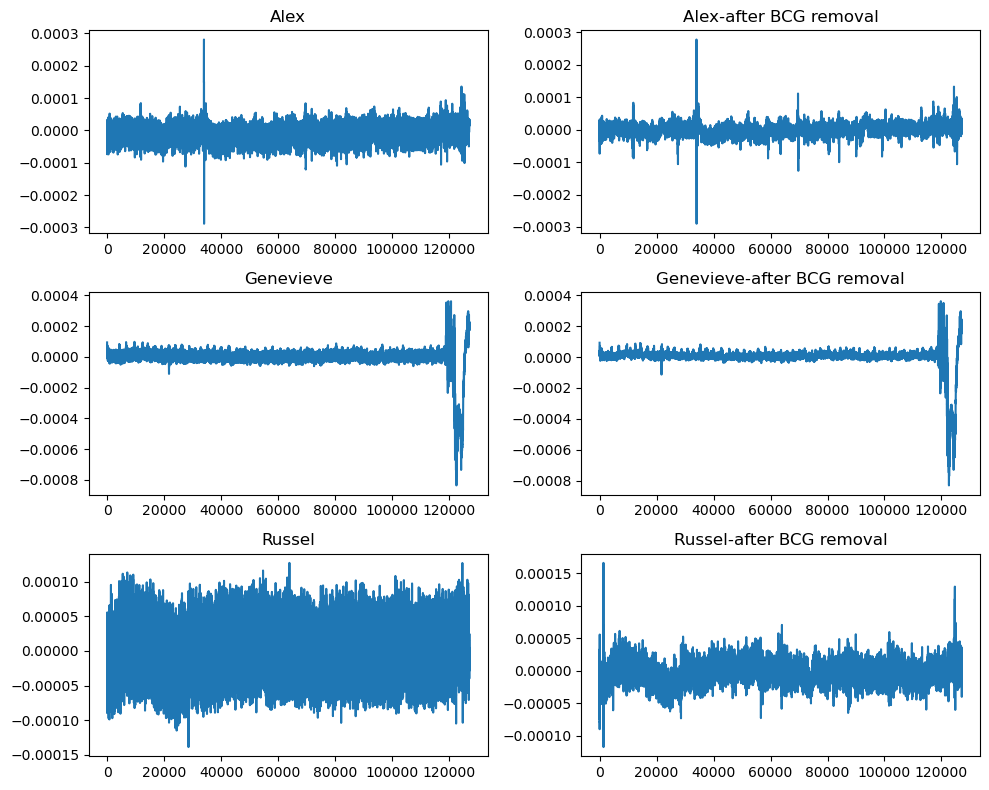

In [9]:
#epoch the data using peaks
mean_bcg_a=np.mean(eps_a,axis=1)
bcg_sub_a=np.copy(resamp_a)
for i in np.arange(1,peaks_a[0].shape[0]-1):
    bcg_sub_a[:,peaks_a[0][i]-105:peaks_a[0][i]+105]=resamp_a[:,peaks_a[0][i]-105:peaks_a[0][i]+105]-mean_bcg_a
    
mean_bcg_g=np.mean(eps_g,axis=1)
bcg_sub_g=np.copy(resamp_g)
for i in np.arange(1,peaks_g[0].shape[0]-1):
    bcg_sub_g[:,peaks_g[0][i]-105:peaks_g[0][i]+105]=resamp_g[:,peaks_g[0][i]-105:peaks_g[0][i]+105]-mean_bcg_g
    
mean_bcg_r=np.mean(eps_r,axis=1)
bcg_sub_r=np.copy(resamp_r)
for i in np.arange(1,peaks_r[0].shape[0]-1):
    bcg_sub_r[:,peaks_r[0][i]-105:peaks_r[0][i]+105]=resamp_r[:,peaks_r[0][i]-105:peaks_r[0][i]+105]-mean_bcg_r
    

fig,axes=plt.subplots(3,2,figsize=(10,8))
axes[0][0].plot(resamp_a[3,:]); axes[0][1].plot(bcg_sub_a[3,:]);
axes[1][0].plot(resamp_g[3,:]); axes[1][1].plot(bcg_sub_g[3,:]);
axes[2][0].plot(resamp_r[3,:]); axes[2][1].plot(bcg_sub_r[3,:]);

axes[0][0].set_title("Alex"); axes[0][1].set_title("Alex-after BCG removal")
axes[1][0].set_title("Genevieve"); axes[1][1].set_title("Genevieve-after BCG removal")
axes[2][0].set_title("Russel"); axes[2][1].set_title("Russel-after BCG removal")
plt.tight_layout()

In [10]:
#Step2-Part C  ALEX
#ICA to isolate good and bad components
#preprocessing

eeg_a.resample(250)
raw_data_a=eeg_a.get_data()
evts_a=mne.events_from_annotations(eeg_a)

vol_trigs_a=evts_a[1]['Response/R128']
vol_inds_a=np.argwhere(evts_a[0][:,2]==vol_trigs_a)
vol_times_a=evts_a[0][vol_inds_a,0].astype(int)

start_a=vol_times_a[0][0]

raw_data_a[:,start_a:start_a+bcg_sub_a.shape[1]]=bcg_sub_a
raw_data_a[:,0:start_a]=0
raw_data_a[:,start_a+bcg_sub_a.shape[1]:]=0

#overwriting eeg data with denoised data
eeg_a._data=raw_data_a

montage_a=mne.channels.make_standard_montage('standard_1020')
eeg_a.set_montage(montage_a,on_missing='ignore')

Used Annotations descriptions: ['New Segment/', 'Response/R128', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S 98', 'Stimulus/S 99', 'SyncStatus/Sync On']


<RawBrainVision | retino_gamma_02.eeg, 64 x 129730 (518.9 s), ~63.4 MB, data loaded>

In [11]:
#Step2-Part C  GENEVIEVE
#ICA to isolate good and bad components
#preprocessing

eeg_g.resample(250)
raw_data_g=eeg_g.get_data()
evts_g=mne.events_from_annotations(eeg_g)

vol_trigs_g=evts_g[1]['Response/R128']
vol_inds_g=np.argwhere(evts_g[0][:,2]==vol_trigs_g)
vol_times_g=evts_g[0][vol_inds_g,0].astype(int)

start_g=vol_times_g[0][0]

raw_data_g[:,start_g:start_g+bcg_sub_g.shape[1]]=bcg_sub_g
raw_data_g[:,0:start_g]=0
raw_data_g[:,start_g+bcg_sub_g.shape[1]:]=0

#overwriting eeg data with denoised data
eeg_g._data=raw_data_g

montage_g=mne.channels.make_standard_montage('standard_1020')
eeg_g.set_montage(montage_g,on_missing='ignore')

Used Annotations descriptions: ['New Segment/', 'Response/R128', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S 98', 'Stimulus/S 99', 'SyncStatus/Sync On']


<RawBrainVision | retino_gamma_02.eeg, 64 x 128995 (516.0 s), ~63.1 MB, data loaded>

In [12]:
#Step2-Part C  RUSSEL
#ICA to isolate good and bad components
#preprocessing

eeg_r.resample(250)
raw_data_r=eeg_r.get_data()
evts_r=mne.events_from_annotations(eeg_r)

vol_trigs_r=evts_r[1]['Response/R128']
vol_inds_r=np.argwhere(evts_r[0][:,2]==vol_trigs_r)
vol_times_r=evts_r[0][vol_inds_r,0].astype(int)

start_r=vol_times_r[0][0]

raw_data_r[:,start_r:start_r+bcg_sub_r.shape[1]]=bcg_sub_r
raw_data_r[:,0:start_r]=0
raw_data_r[:,start_r+bcg_sub_r.shape[1]:]=0

#overwriting eeg data with denoised data
eeg_r._data=raw_data_r

montage_r=mne.channels.make_standard_montage('standard_1020')
eeg_r.set_montage(montage_r,on_missing='ignore')

Used Annotations descriptions: ['New Segment/', 'Response/R128', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S 98', 'Stimulus/S 99', 'SyncStatus/Sync On']


<RawBrainVision | 4 gamma.eeg, 64 x 129600 (518.4 s), ~63.4 MB, data loaded>

In [13]:
#Performing high pass filter to remove low frequency drifts
eeg_a.filter(1,124)
ica_a=mne.preprocessing.ICA(n_components=60) #to define how many components we want to decompose into: n_components
good_ch_a=np.arange(0,63)
good_ch_a=np.delete(good_ch_a,31)
ica_a.fit(eeg_a,picks=good_ch_a)


eeg_g.filter(1,124)
ica_g=mne.preprocessing.ICA(n_components=60) #to define how many components we want to decompose into: n_components
good_ch_g=np.arange(0,63)
good_ch_g=np.delete(good_ch_g,31)
ica_g.fit(eeg_g,picks=good_ch_g)


eeg_r.filter(1,124)
ica_r=mne.preprocessing.ICA(n_components=60) #to define how many components we want to decompose into: n_components
good_ch_r=np.arange(0,63)
good_ch_r=np.delete(good_ch_r,31)
ica_r.fit(eeg_r,picks=good_ch_r)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 124.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 124.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.2s finished


Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by number: 60 components
Fitting ICA took 21.5s.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 124.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 124.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Fitting ICA to data using 62 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.3s finished


Selecting by number: 60 components
Fitting ICA took 17.8s.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 124.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 124.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Fitting ICA to data using 62 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.3s finished


Selecting by number: 60 components
Fitting ICA took 15.9s.


Method,fastica
Fit,77 iterations on raw data (129600 samples)
ICA components,60
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


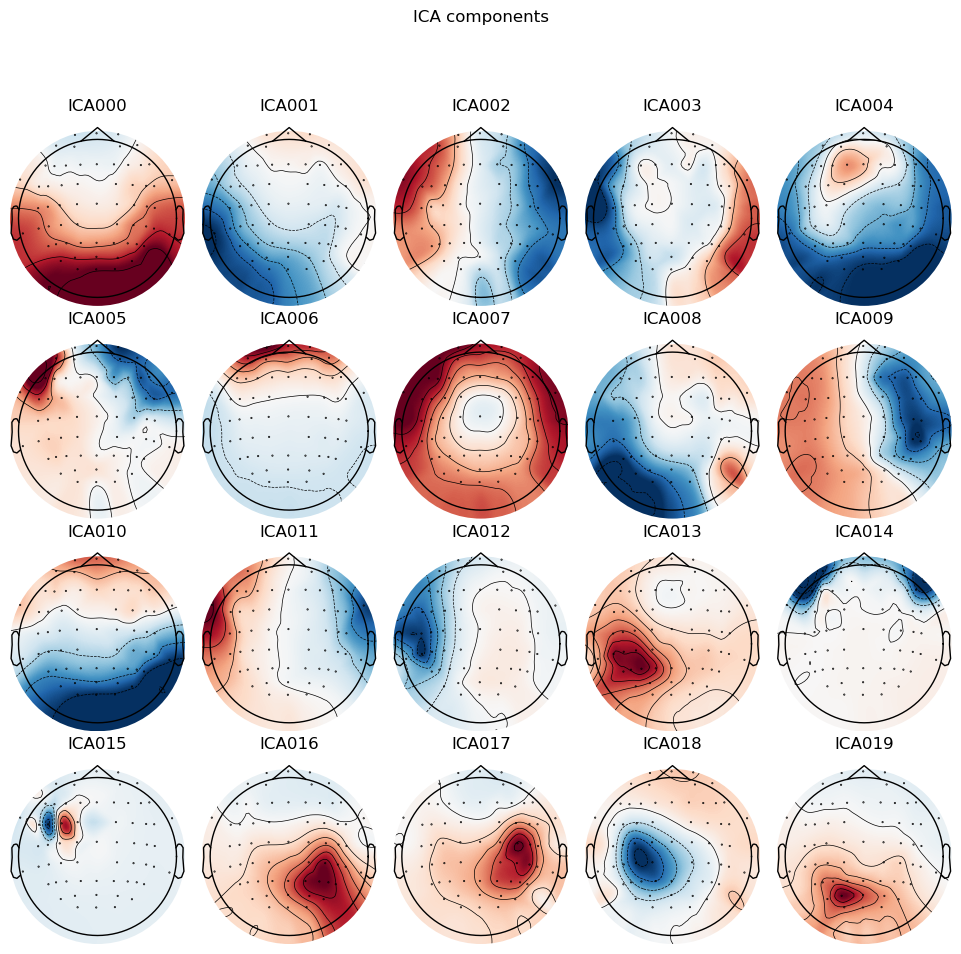

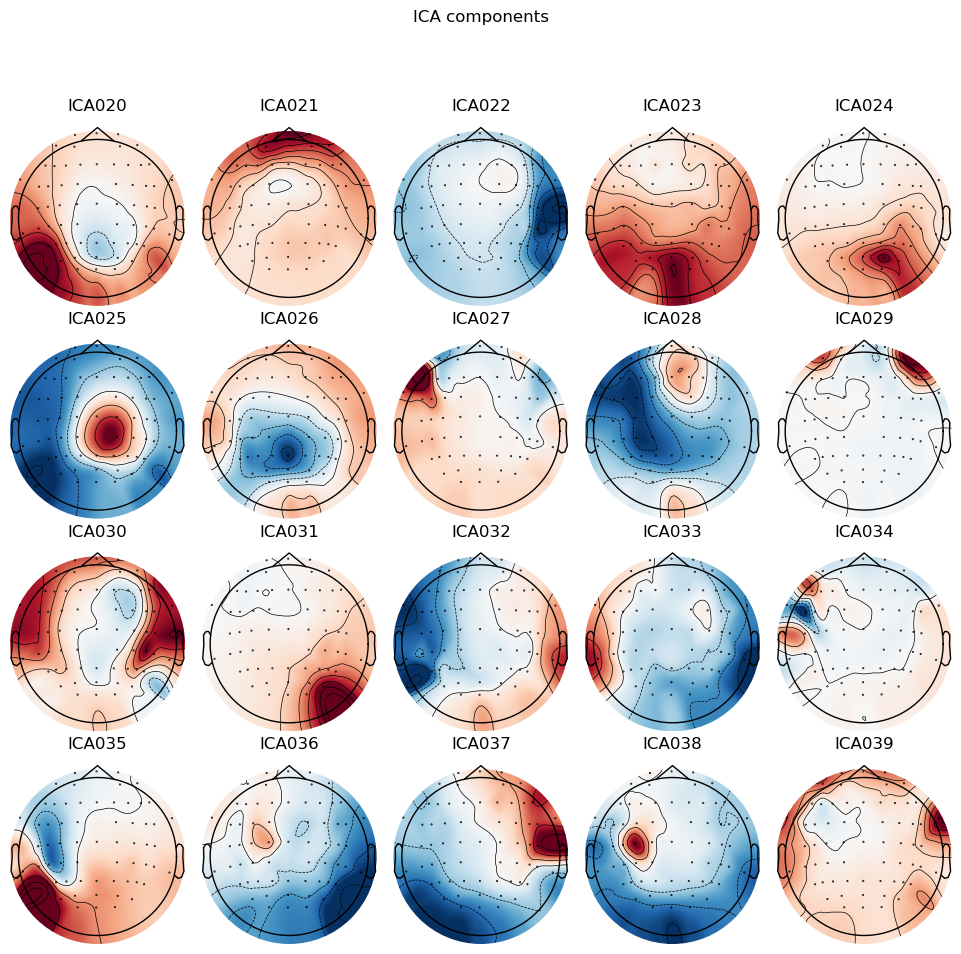

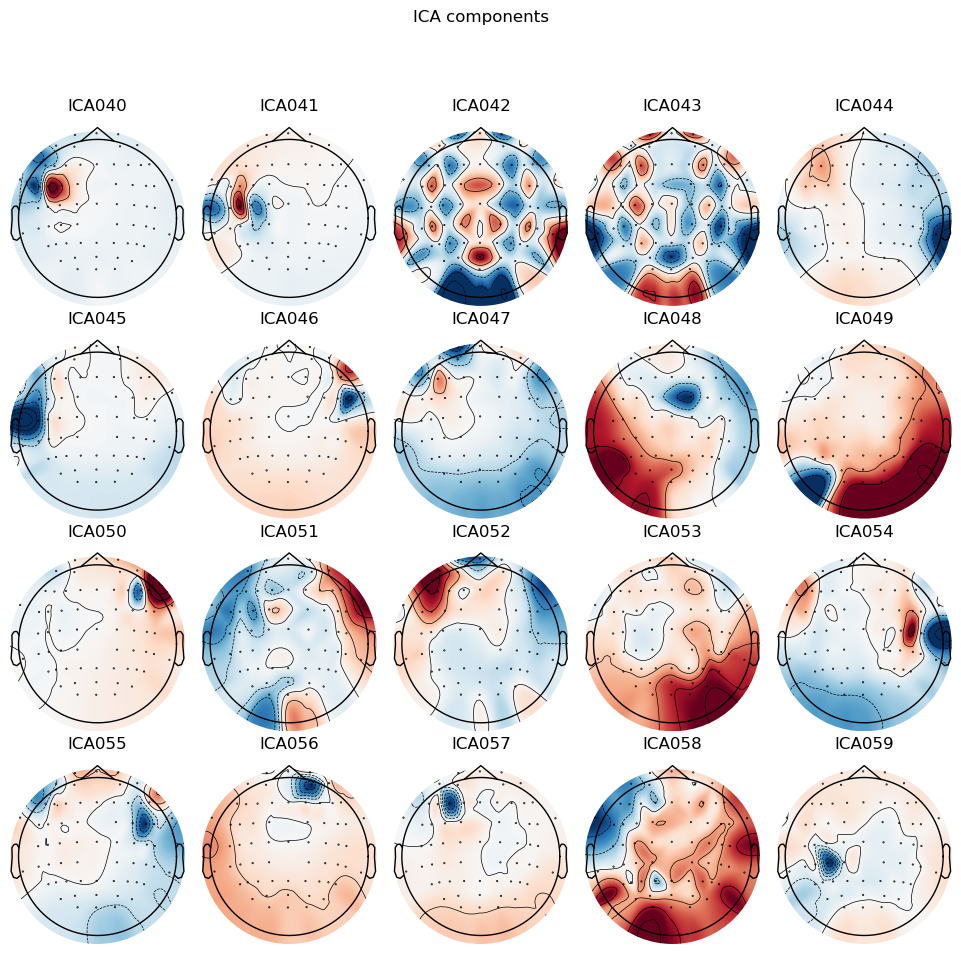

Creating RawArray with float64 data, n_channels=60, n_times=129730
    Range : 0 ... 129729 =      0.000 ...   518.916 secs
Ready.
Using matplotlib as 2D backend.


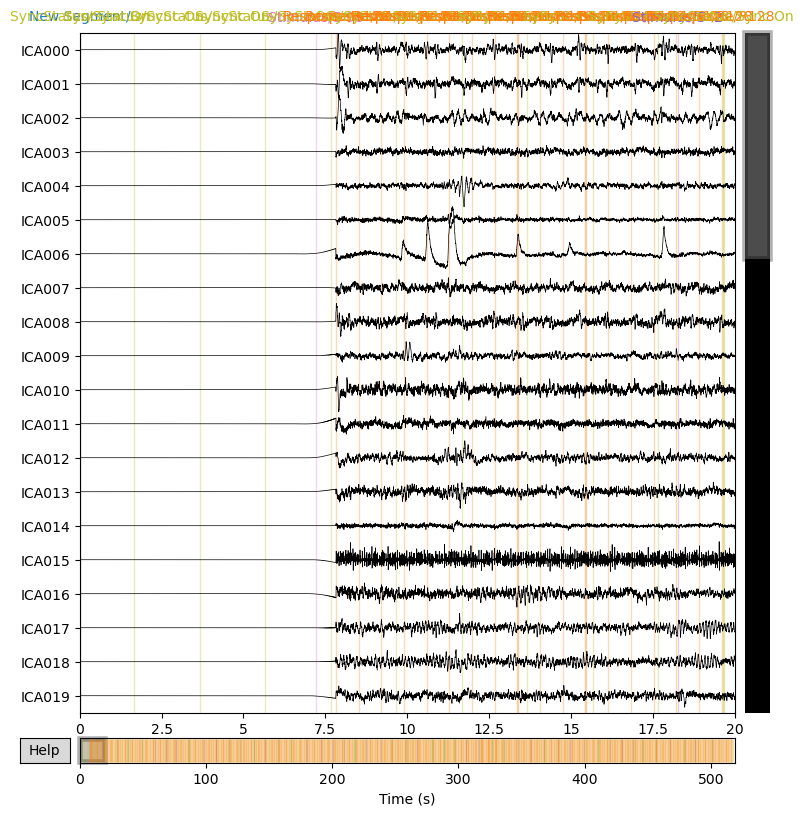

In [14]:
#Visualising the components- ALEX
ica_a.plot_components()
ica_a.plot_sources(eeg_a)
sources_a=ica_a.get_sources(eeg_a)._data

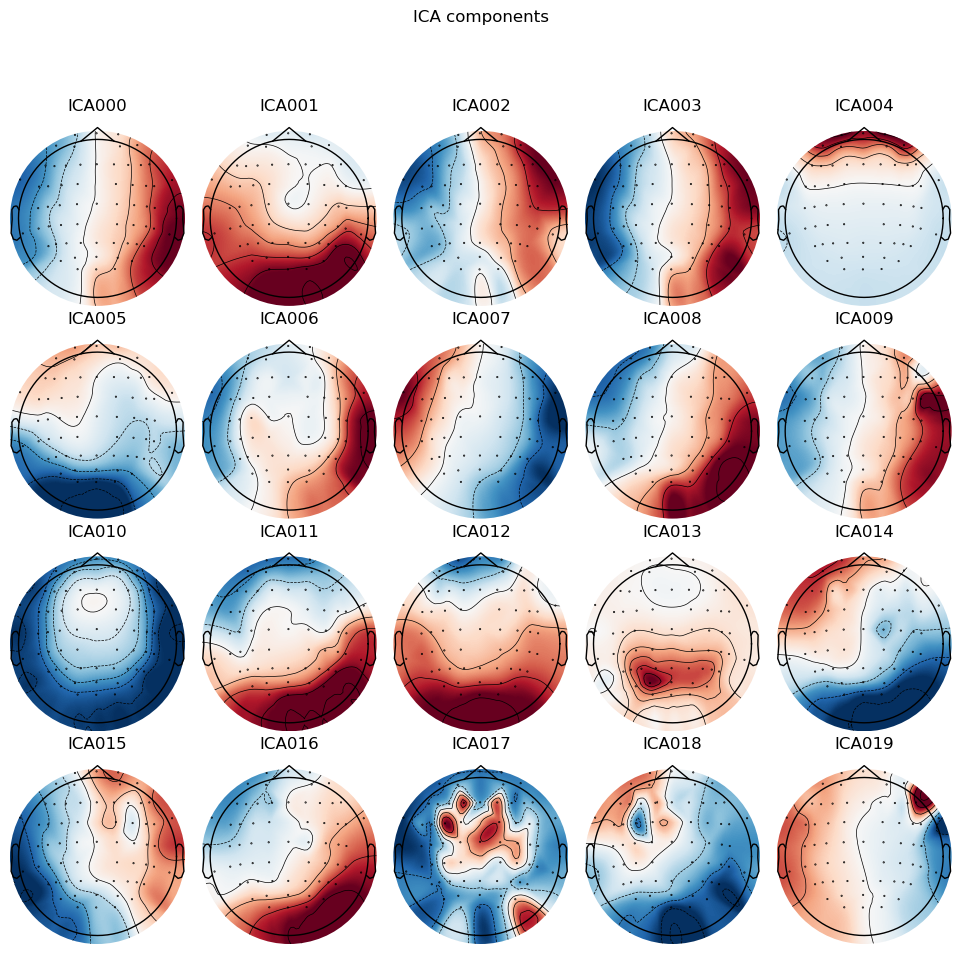

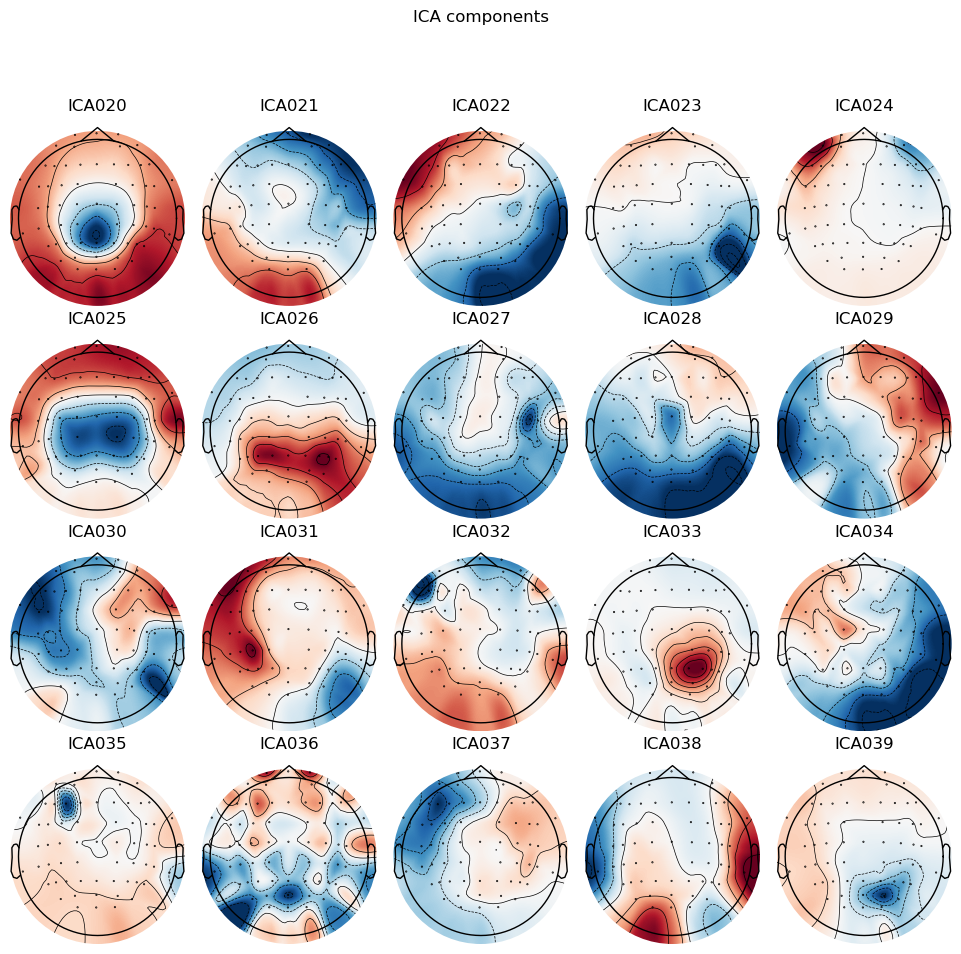

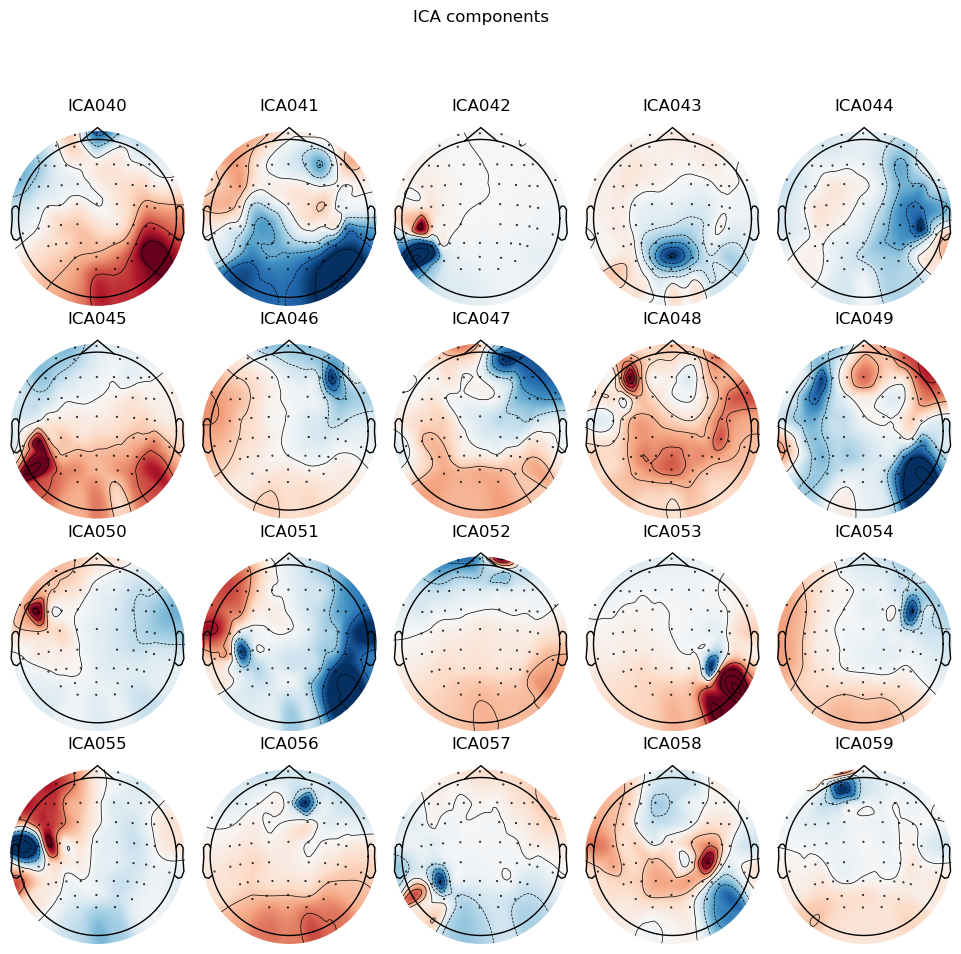

Creating RawArray with float64 data, n_channels=60, n_times=128995
    Range : 0 ... 128994 =      0.000 ...   515.976 secs
Ready.


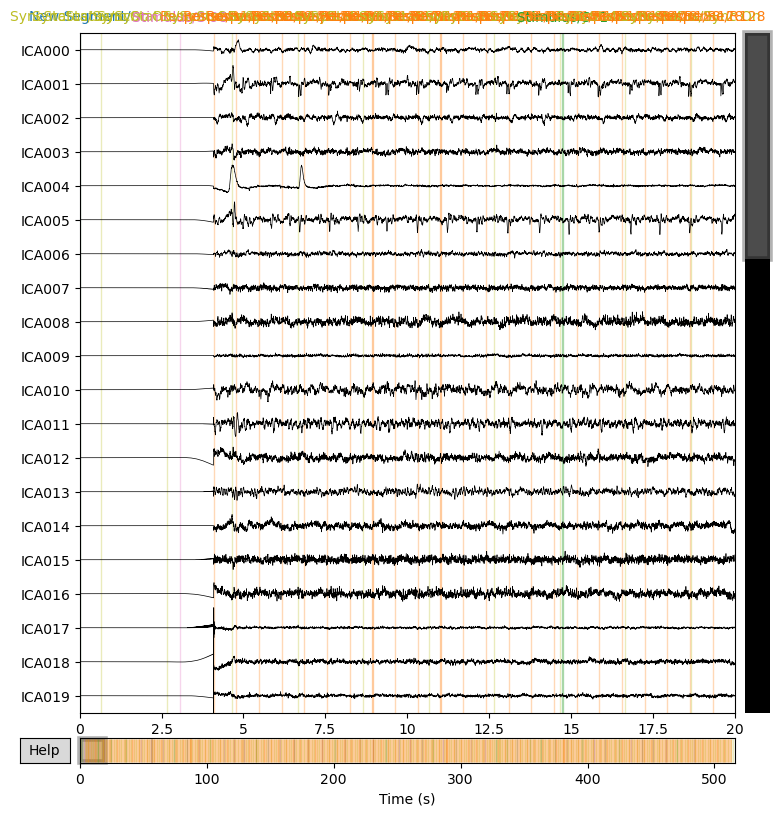

In [15]:
#Visualising the components- GENEVIEVE
ica_g.plot_components()
ica_g.plot_sources(eeg_g)
sources_g=ica_g.get_sources(eeg_g)._data

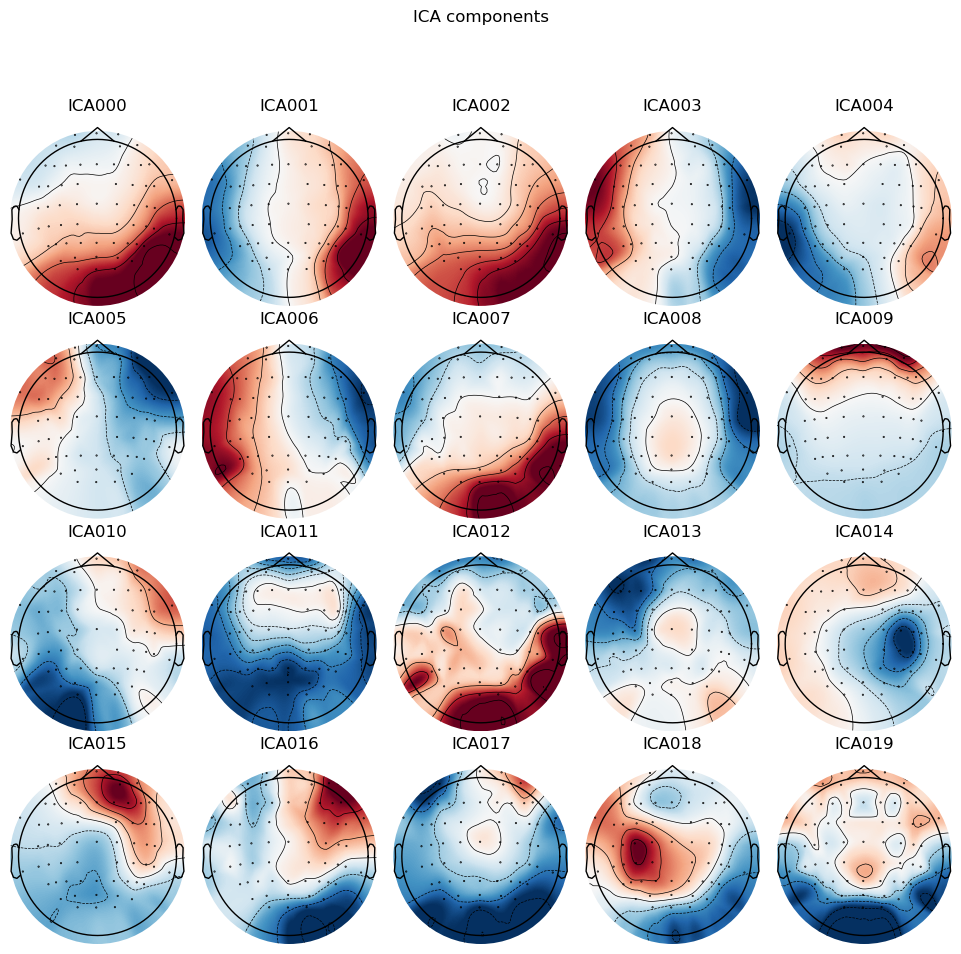

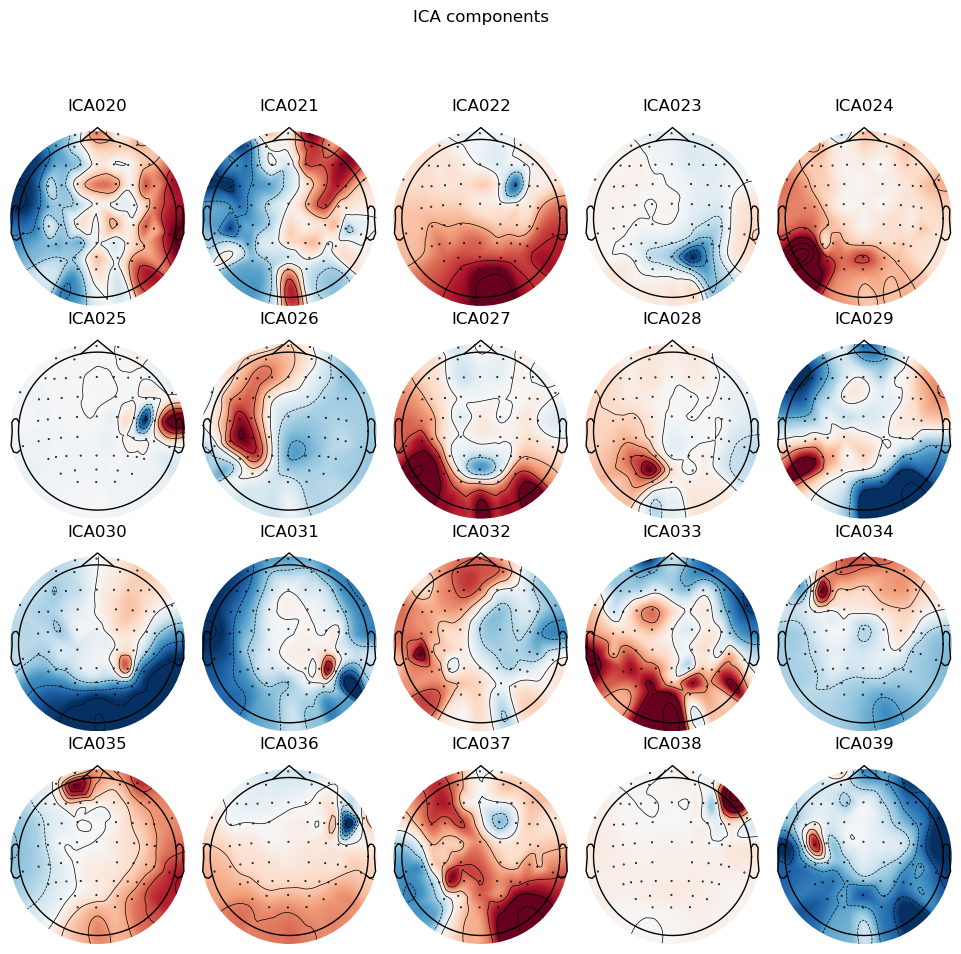

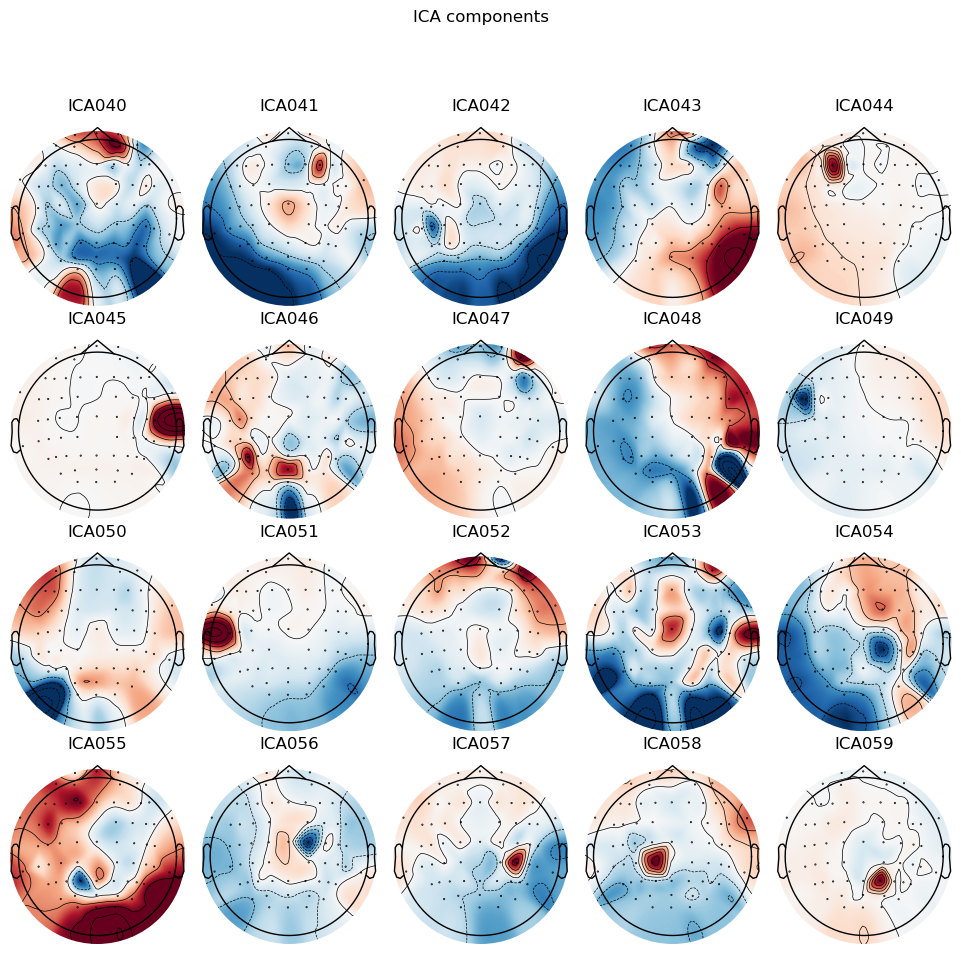

Creating RawArray with float64 data, n_channels=60, n_times=129600
    Range : 0 ... 129599 =      0.000 ...   518.396 secs
Ready.


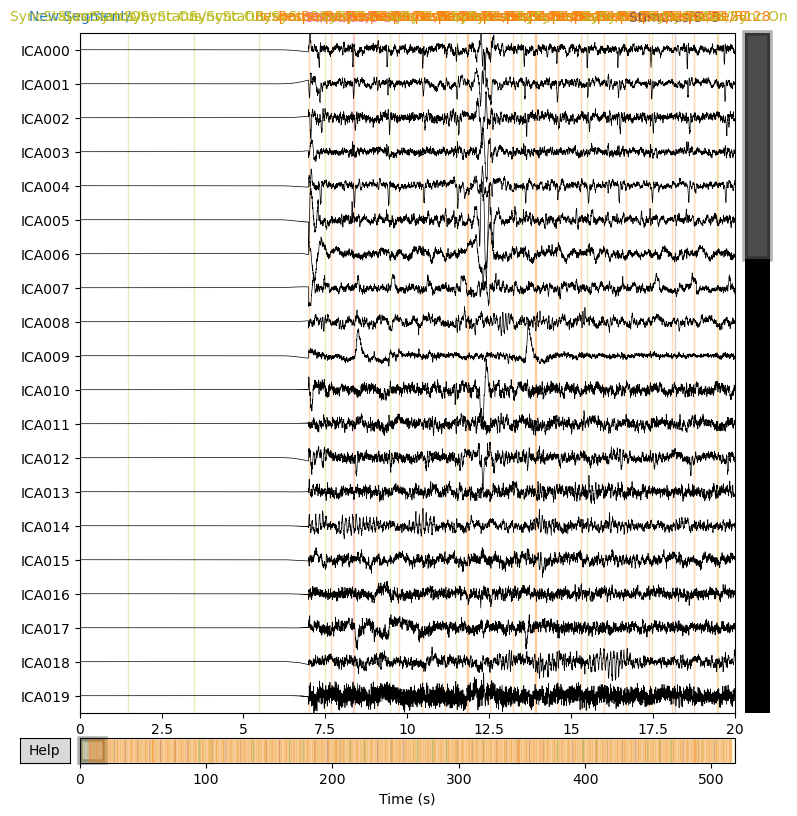

In [16]:
#Visualising the components- RUSSEL
ica_r.plot_components()
ica_r.plot_sources(eeg_r)
sources_r=ica_r.get_sources(eeg_r)._data

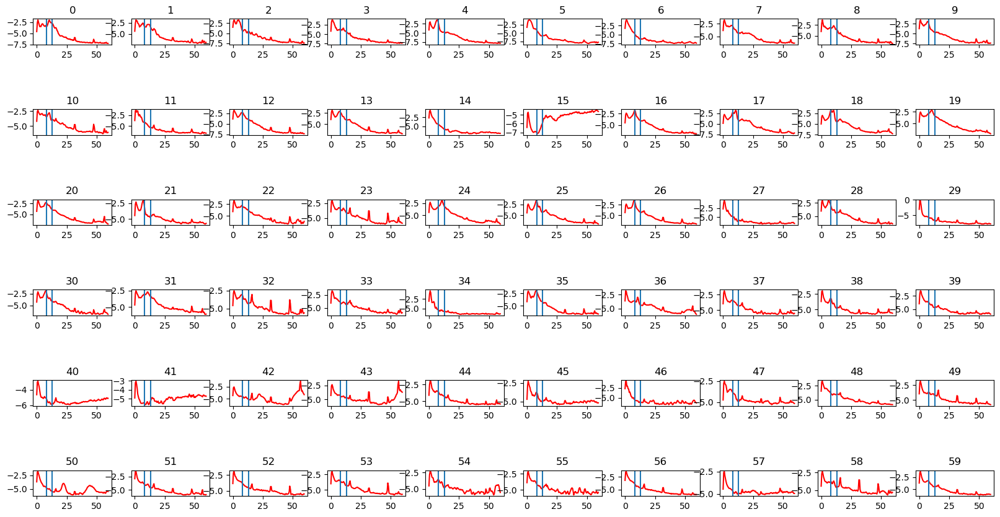

In [17]:
#Plotting power spectral density of each source- ALEX

from scipy.signal import welch
psd_a=welch(sources_a,fs=250,nperseg=500)

fig, axes = plt.subplots(6, 10, figsize=(20, 10))  # Adjust the width and height as desired

for i in np.arange(0, 60):
    ax = axes[i // 10, i % 10]
    ax.plot(psd_a[0][0:120], np.log(psd_a[1][i, 0:120]), 'r')
    ax.axvline(8)
    ax.axvline(13)
    ax.set_title(i)
    
plt.subplots_adjust(hspace=2.5, wspace=0.25)  # Adjust the horizontal and vertical spacing

plt.show()

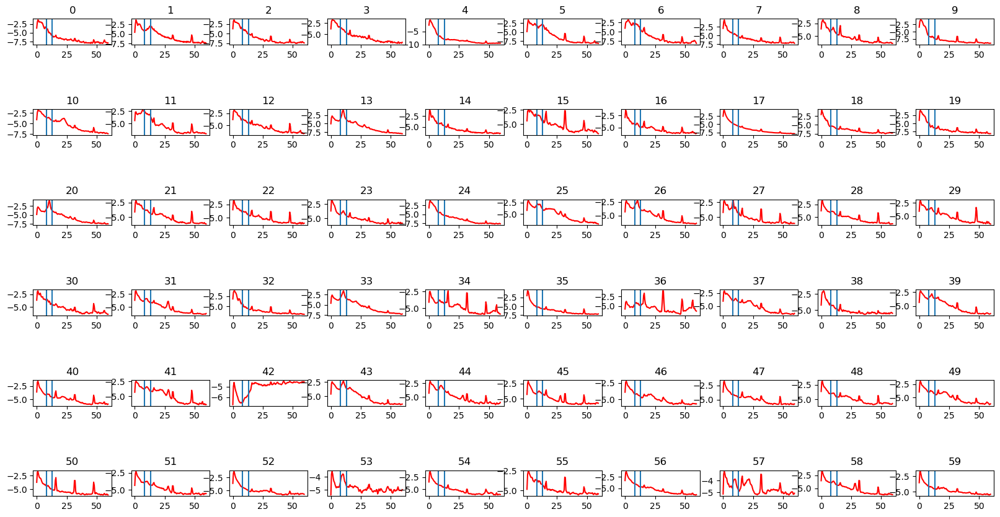

In [18]:
#Plotting power spectral density of each source- GENEVIEVE

from scipy.signal import welch
psd_g=welch(sources_g,fs=250,nperseg=500)

fig, axes = plt.subplots(6, 10, figsize=(20, 10))  # Adjust the width and height as desired

for i in np.arange(0, 60):
    ax = axes[i // 10, i % 10]
    ax.plot(psd_g[0][0:120], np.log(psd_g[1][i, 0:120]), 'r')
    ax.axvline(8)
    ax.axvline(13)
    ax.set_title(i)
    
plt.subplots_adjust(hspace=2.5, wspace=0.25)  # Adjust the horizontal and vertical spacing

plt.show()

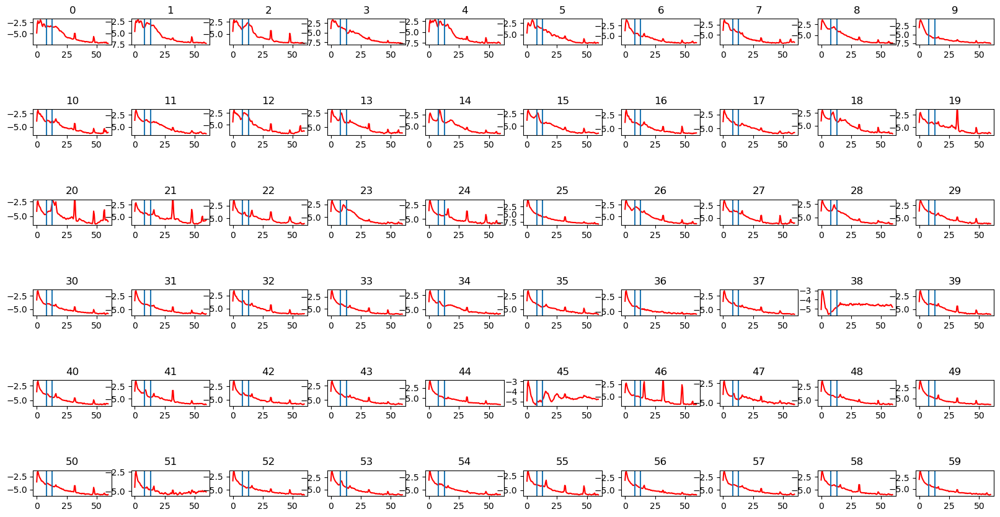

In [19]:
#Plotting power spectral density of each source- RUSSEL

from scipy.signal import welch
psd_r=welch(sources_r,fs=250,nperseg=500)

fig, axes = plt.subplots(6, 10, figsize=(20, 10))  # Adjust the width and height as desired

for i in np.arange(0, 60):
    ax = axes[i // 10, i % 10]
    ax.plot(psd_r[0][0:120], np.log(psd_r[1][i, 0:120]), 'r')
    ax.axvline(8)
    ax.axvline(13)
    ax.set_title(i)
    
plt.subplots_adjust(hspace=2.5, wspace=0.25)  # Adjust the horizontal and vertical spacing

plt.show()

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 413 samples (1.652 s)

Setting up band-pass filter from 40 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 40.00
- Lower transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 35.00 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
-

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished


Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 413 samples (1.652 s)

Setting up band-pass filter from 40 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 40.00
- Lower transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 35.00 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
-

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished


Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 413 samples (1.652 s)

Setting up band-pass filter from 40 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 40.00
- Lower transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 35.00 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
-

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished


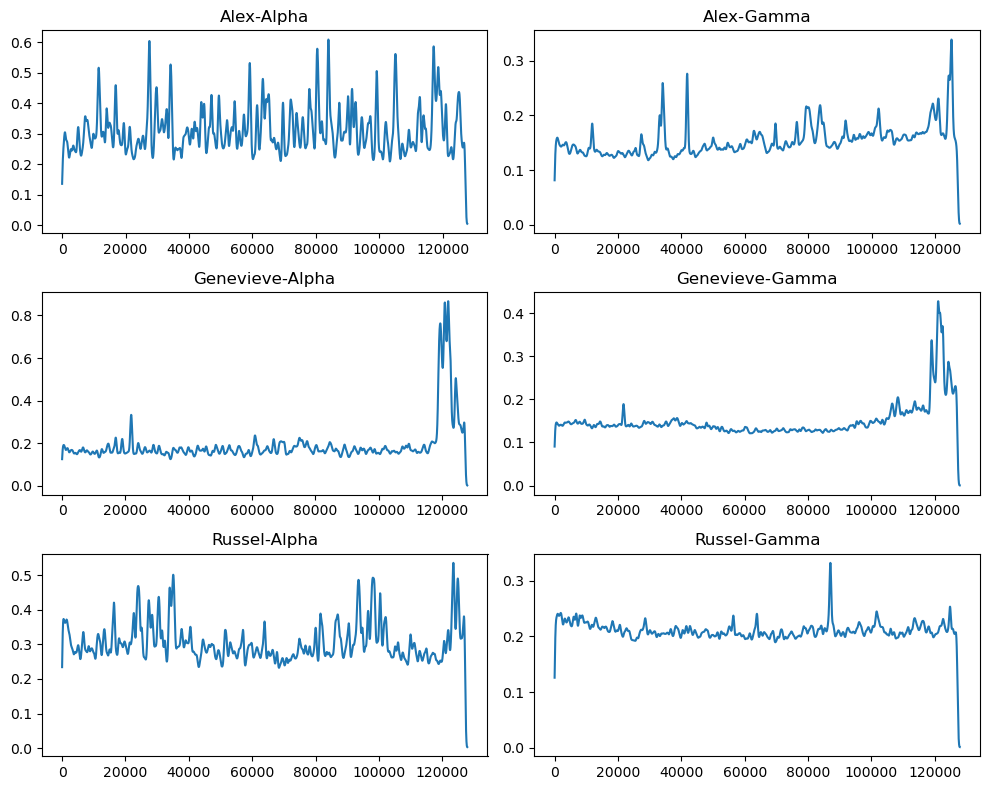

In [20]:
good_comp_a=sources_a[[6,12,14,17,21,24,28],:] #comopnents that have peak in 8-13 HZ band i.e., alpha band are good components
#alpha components
alpha_comp_a=mne.filter.filter_data(good_comp_a,250,8,13)
alpha_comp_a=np.abs(alpha_comp_a)
gamma_comp_a=mne.filter.filter_data(good_comp_a,250,40,60)
gamma_comp_a=np.abs(gamma_comp_a)
from scipy.ndimage import gaussian_filter1d
smthalphacomp_a=gaussian_filter1d(alpha_comp_a,250,axis=1)
trim_alpha_a=np.mean(smthalphacomp_a[:,start_a:],axis=0) 
#gamma 
smthgamma_comp_a=gaussian_filter1d(gamma_comp_a,250,axis=1)
trim_gamma_a=np.mean(smthgamma_comp_a[:,start_a:],axis=0)

good_comp_g=sources_g[[6,12,14,17,21,24,28],:] #comopnents that have peak in 8-13 HZ band i.e., alpha band are good components
#alpha components
alpha_comp_g=mne.filter.filter_data(good_comp_g,250,8,13)
alpha_comp_g=np.abs(alpha_comp_g)
gamma_comp_g=mne.filter.filter_data(good_comp_g,250,40,60)
gamma_comp_g=np.abs(gamma_comp_g)
smthalphacomp_g=gaussian_filter1d(alpha_comp_g,250,axis=1)
trim_alpha_g=np.mean(smthalphacomp_g[:,start_g:],axis=0) 
#gamma 
smthgamma_comp_g=gaussian_filter1d(gamma_comp_g,250,axis=1)
trim_gamma_g=np.mean(smthgamma_comp_g[:,start_g:],axis=0)

good_comp_r=sources_r[[6,12,14,17,21,24,28],:] #comopnents that have peak in 8-13 HZ band i.e., alpha band are good components
#alpha components
alpha_comp_r=mne.filter.filter_data(good_comp_r,250,8,13)
alpha_comp_r=np.abs(alpha_comp_r)
gamma_comp_r=mne.filter.filter_data(good_comp_r,250,40,60)
gamma_comp_r=np.abs(gamma_comp_r)
smthalphacomp_r=gaussian_filter1d(alpha_comp_r,250,axis=1)
trim_alpha_r=np.mean(smthalphacomp_r[:,start_r:],axis=0)
#gamma 
smthgamma_comp_r=gaussian_filter1d(gamma_comp_r,250,axis=1)
trim_gamma_r=np.mean(smthgamma_comp_r[:,start_r:],axis=0)


fig,axes=plt.subplots(3,2,figsize=(10,8))
axes[0][0].plot(trim_alpha_a); axes[0][1].plot(trim_gamma_a);
axes[1][0].plot(trim_alpha_g); axes[1][1].plot(trim_gamma_g);
axes[2][0].plot(trim_alpha_r); axes[2][1].plot(trim_gamma_r);

axes[0][0].set_title("Alex-Alpha"); axes[0][1].set_title("Alex-Gamma")
axes[1][0].set_title("Genevieve-Alpha"); axes[1][1].set_title("Genevieve-Gamma")
axes[2][0].set_title("Russel-Alpha"); axes[2][1].set_title("Russel-Gamma")
plt.tight_layout()

In [21]:
#downsampling alpha-ALEX
n_timepts_a=vol_times_a.shape[0] #450
resalpha_a=resample(trim_alpha_a,n_timepts_a)
#accounting for HRF
shift_a=int(5/0.693)
shift_alpha_a=np.roll(resalpha_a,shift_a)
shift_alpha_a=mne.filter.filter_data(shift_alpha_a,1/0.693,0.01,0.7)
#downsampling gamma
resgamma_a=resample(trim_gamma_a,n_timepts_a)
#accounting for HRF
shift_gamma_a=np.roll(resgamma_a,shift_a)
shift_gamma_a=mne.filter.filter_data(shift_gamma_a,1/0.693,0.01,0.7)

#downsampling alpha-GENEVIEVE
n_timepts_g=vol_times_g.shape[0] #450
resalpha_g=resample(trim_alpha_g,n_timepts_g)
#accounting for HRF
shift_g=int(5/0.693)
shift_alpha_g=np.roll(resalpha_g,shift_g)
shift_alpha_g=mne.filter.filter_data(shift_alpha_g,1/0.693,0.01,0.7)
#downsampling gamma
resgamma_g=resample(trim_gamma_g,n_timepts_g)
#accounting for HRF
shift_gamma_g=np.roll(resgamma_g,shift_g)
shift_gamma_g=mne.filter.filter_data(shift_gamma_g,1/0.693,0.01,0.7)

#downsampling alpha-RUSSEL
n_timepts_r=vol_times_r.shape[0] #450
resalpha_r=resample(trim_alpha_r,n_timepts_r)
#accounting for HRF
shift_r=int(5/0.693)
shift_alpha_r=np.roll(resalpha_r,shift_r)
shift_alpha_r=mne.filter.filter_data(shift_alpha_r,1/0.693,0.01,0.7)
#downsampling gamma
resgamma_r=resample(trim_gamma_r,n_timepts_r)
#accounting for HRF
shift_gamma_r=np.roll(resgamma_r,shift_r)
shift_gamma_r=mne.filter.filter_data(shift_gamma_r,1/0.693,0.01,0.7)

Setting up band-pass filter from 0.01 - 0.7 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.01
- Lower transition bandwidth: 0.01 Hz (-6 dB cutoff frequency: 0.01 Hz)
- Upper passband edge: 0.70 Hz
- Upper transition bandwidth: 0.02 Hz (-6 dB cutoff frequency: 0.71 Hz)
- Filter length: 477 samples (330.561 s)

Setting up band-pass filter from 0.01 - 0.7 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.01
- Lower transition bandwidth: 0.01 Hz (-6 dB cutoff frequency: 0.01 Hz)
- Upper passband edge: 0.70 Hz
- Upper transition bandwidth: 0.02 Hz (-6 dB cutoff frequency: 0.71 Hz)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

C:\Users\nikhi\AppData\Local\Temp\ipykernel_436\2658377102.py:14: RuntimeWarning: invalid value encountered in true_divide
  corrmap_alex_rest_a = numerator_a / denominator_a


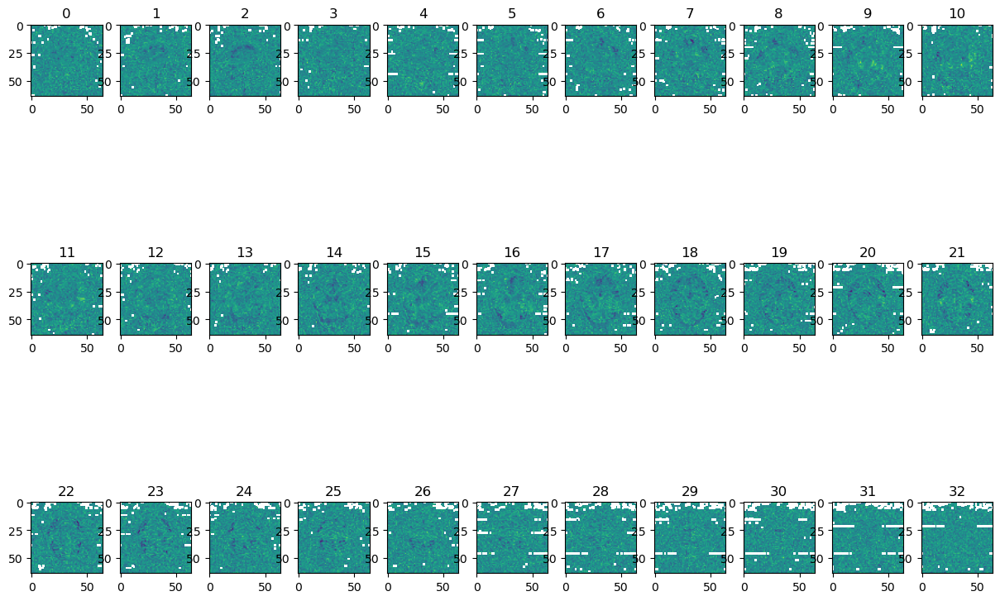

In [22]:
#Step 4
#correlate with bold
                                          #ALEX-alpha
import nibabel as nib
bold_a=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/retino_gamma_02.nii.gz").get_fdata()
#creating an empty 4d array
alpha_4d_a=np.zeros(bold_a.shape)
alpha_4d_a=alpha_4d_a[:,:,:,0:shift_alpha_a.shape[0]]+shift_alpha_a
timepoints_a=np.arange(30,450)
mean_bold_a = np.mean(bold_a, axis=3, keepdims=True)
mean_alpha4d_a = np.mean(alpha_4d_a, axis=3, keepdims=True)
numerator_a = np.sum((bold_a[:, :, :, timepoints_a] - mean_bold_a) * (alpha_4d_a[:, :, :, timepoints_a] - mean_alpha4d_a), axis=3)
denominator_a = np.sqrt(np.sum((bold_a[:, :, :, timepoints_a] - mean_bold_a) ** 2, axis=3)) * np.sqrt(np.sum((alpha_4d_a[:, :, :, timepoints_a] - mean_alpha4d_a) ** 2, axis=3))
corrmap_alex_rest_a = numerator_a / denominator_a
fig, axes = plt.subplots(3, 11, figsize=(15, 10))  # Adjust the width and height as desired
for i in np.arange(0, 33):
    ax = axes[i // 11, i % 11]
    ax.imshow(np.rot90(corrmap_alex_rest_a[:, :, i]), vmin=-0.3, vmax=0.3)
    ax.set_title(i)

plt.subplots_adjust(hspace=0.5, wspace=0.25)  # Adjust the horizontal and vertical spacing
plt.show()

C:\Users\nikhi\AppData\Local\Temp\ipykernel_436\3775104537.py:19: RuntimeWarning: invalid value encountered in true_divide
  corrmap_alex_rest_gamma = numerator_a1 / denominator_a1


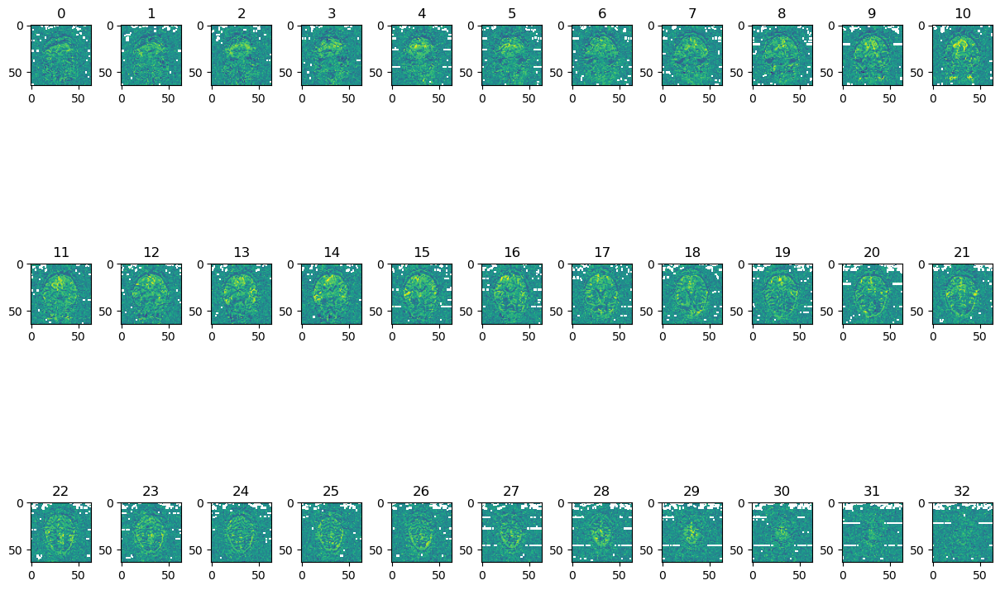

In [23]:
#correlate with bold
#gamma
                                          #ALEX-gamma
import nibabel as nib
bold_a1=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/retino_gamma_02.nii.gz").get_fdata()

#creating an empty 4d array
gamma_4d_a=np.zeros(bold_a1.shape)
gamma_4d_a=gamma_4d_a[:,:,:,0:shift_gamma_a.shape[0]]+shift_gamma_a

timepoints_a=np.arange(30,450)

mean_bold_a = np.mean(bold_a1, axis=3, keepdims=True)
mean_gamma4d_a = np.mean(gamma_4d_a, axis=3, keepdims=True)

numerator_a1 = np.sum((bold_a1[:, :, :, timepoints_a] - mean_bold_a) * (gamma_4d_a[:, :, :, timepoints_a] - mean_gamma4d_a), axis=3)
denominator_a1 = np.sqrt(np.sum((bold_a1[:, :, :, timepoints_a] - mean_bold_a) ** 2, axis=3)) * np.sqrt(np.sum((gamma_4d_a[:, :, :, timepoints_a] - mean_gamma4d_a) ** 2, axis=3))

corrmap_alex_rest_gamma = numerator_a1 / denominator_a1
    
fig, axes = plt.subplots(3, 11, figsize=(15, 10))  # Adjust the width and height as desired

for i in np.arange(0, 33):
    ax = axes[i // 11, i % 11]
    ax.imshow(np.rot90(corrmap_alex_rest_gamma[:, :, i]), vmin=-0.3, vmax=0.3)
    ax.set_title(i)

plt.subplots_adjust(hspace=0.5, wspace=0.5)  # Adjust the horizontal and vertical spacing
plt.show()

C:\Users\nikhi\AppData\Local\Temp\ipykernel_436\879384687.py:16: RuntimeWarning: invalid value encountered in true_divide
  corrmap_gen_rest_alpha = numerator_g / denominator_g


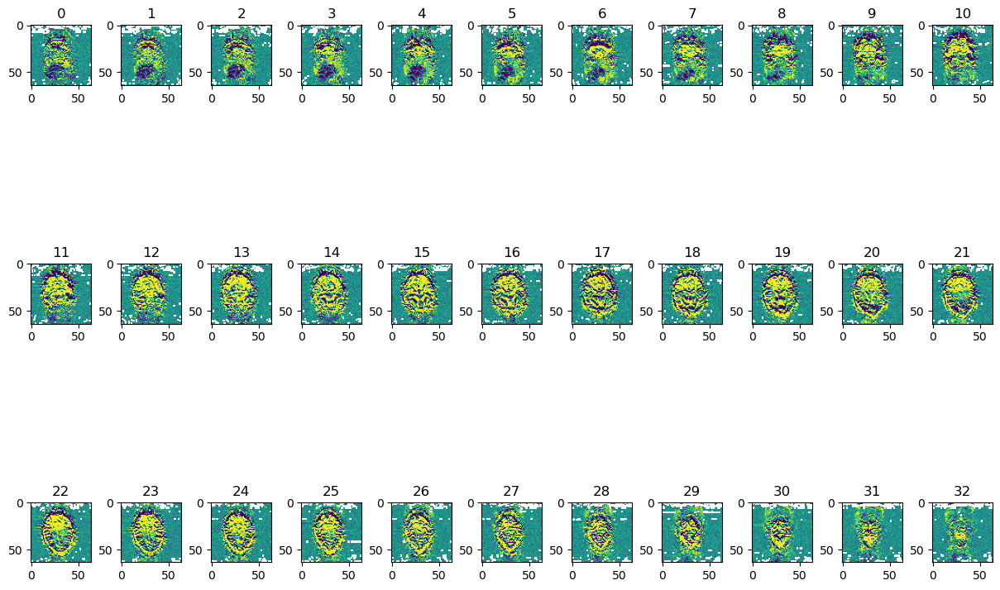

In [24]:
#Step 4
#correlate with bold
                                    #GENEVIEVE-alpha
import nibabel as nib
bold_g=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/retino_gamma_01.nii.gz").get_fdata()
#creating an empty 4d array
alpha_4d_g=np.zeros(bold_g.shape)
alpha_4d_g=alpha_4d_g[:,:,:,0:shift_alpha_g.shape[0]]+shift_alpha_g
timepoints=np.arange(30,450)
mean_bold_g = np.mean(bold_g, axis=3, keepdims=True)
mean_alpha4d_g = np.mean(alpha_4d_g, axis=3, keepdims=True)

numerator_g = np.sum((bold_g[:, :, :, timepoints] - mean_bold_g) * (alpha_4d_g[:, :, :, timepoints] - mean_alpha4d_g), axis=3)
denominator_g = np.sqrt(np.sum((bold_g[:, :, :, timepoints] - mean_bold_g) ** 2, axis=3)) * np.sqrt(np.sum((alpha_4d_g[:, :, :, timepoints] - mean_alpha4d_g) ** 2, axis=3))

corrmap_gen_rest_alpha = numerator_g / denominator_g

fig, axes = plt.subplots(3, 11, figsize=(15, 10))  # Adjust the width and height as desired

for i in np.arange(0, 33):
    ax = axes[i // 11, i % 11]
    ax.imshow(np.rot90(corrmap_gen_rest_alpha[:, :, i]), vmin=-0.3, vmax=0.3)
    ax.set_title(i)

plt.subplots_adjust(hspace=0.5, wspace=0.5)  # Adjust the horizontal and vertical spacing
plt.show()

C:\Users\nikhi\AppData\Local\Temp\ipykernel_436\1312643155.py:16: RuntimeWarning: invalid value encountered in true_divide
  corrmap_gen_rest_gamma = numerator_g1 / denominator_g1


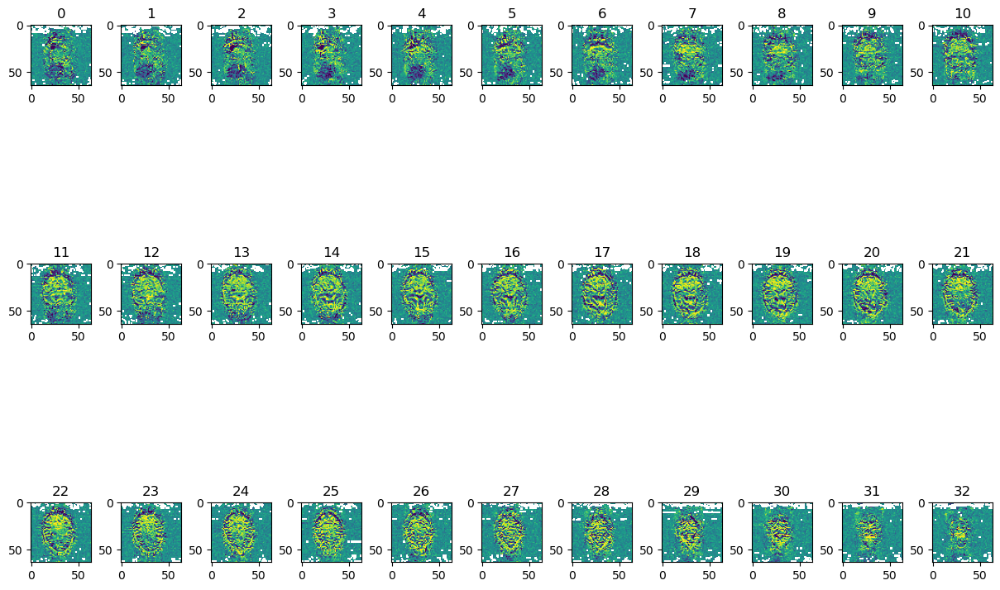

In [25]:
#correlate with bold
#gamma
                                            #GENEVIEVE-gamma
import nibabel as nib
bold_g1=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/retino_gamma_01.nii.gz").get_fdata()
#creating an empty 4d array
gamma_4d_g=np.zeros(bold_g1.shape)
gamma_4d_g=gamma_4d_g[:,:,:,0:shift_gamma_g.shape[0]]+shift_gamma_g
timepoints=np.arange(30,450)
mean_bold_g = np.mean(bold_g1, axis=3, keepdims=True)
mean_gamma4d_g = np.mean(gamma_4d_g, axis=3, keepdims=True)

numerator_g1 = np.sum((bold_g1[:, :, :, timepoints] - mean_bold_g) * (gamma_4d_g[:, :, :, timepoints] - mean_gamma4d_g), axis=3)
denominator_g1 = np.sqrt(np.sum((bold_g1[:, :, :, timepoints] - mean_bold_g) ** 2, axis=3)) * np.sqrt(np.sum((gamma_4d_g[:, :, :, timepoints] - mean_gamma4d_g) ** 2, axis=3))

corrmap_gen_rest_gamma = numerator_g1 / denominator_g1
    
fig, axes = plt.subplots(3, 11, figsize=(15, 10))  # Adjust the width and height as desired

for i in np.arange(0, 33):
    ax = axes[i // 11, i % 11]
    ax.imshow(np.rot90(corrmap_gen_rest_gamma[:, :, i]), vmin=-0.3, vmax=0.3)
    ax.set_title(i)

plt.subplots_adjust(hspace=0.5, wspace=0.5)  # Adjust the horizontal and vertical spacing
plt.show()

C:\Users\nikhi\AppData\Local\Temp\ipykernel_436\2073136924.py:16: RuntimeWarning: invalid value encountered in true_divide
  corrmap_russ_rest_alpha = numerator_r / denominator_r


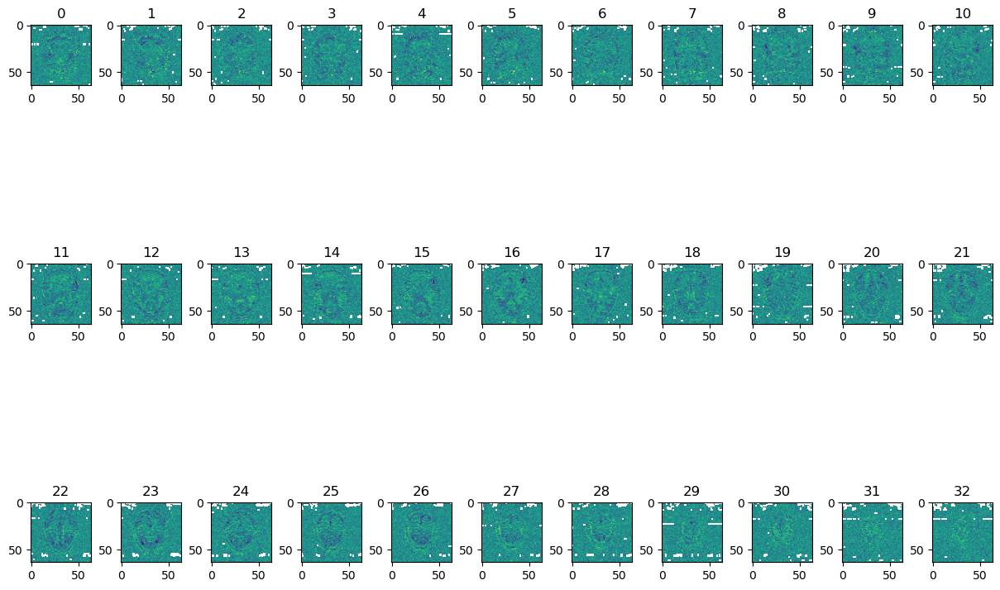

In [26]:
#Step 4
#correlate with bold
                                       #RUSSEL-alpha
import nibabel as nib
bold_r=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/retino_gamma_02.nii.gz").get_fdata()
#creating an empty 4d array
alpha_4d_r=np.zeros(bold_r.shape)
alpha_4d_r=alpha_4d_r[:,:,:,0:shift_alpha_r.shape[0]]+shift_alpha_r
timepoints=np.arange(30,450)
mean_bold_r = np.mean(bold_r, axis=3, keepdims=True)
mean_alpha4d_r = np.mean(alpha_4d_r, axis=3, keepdims=True)

numerator_r = np.sum((bold_r[:, :, :, timepoints] - mean_bold_r) * (alpha_4d_r[:, :, :, timepoints] - mean_alpha4d_r), axis=3)
denominator_r = np.sqrt(np.sum((bold_r[:, :, :, timepoints] - mean_bold_r) ** 2, axis=3)) * np.sqrt(np.sum((alpha_4d_r[:, :, :, timepoints] - mean_alpha4d_r) ** 2, axis=3))

corrmap_russ_rest_alpha = numerator_r / denominator_r

fig, axes = plt.subplots(3, 11, figsize=(15, 10))  # Adjust the width and height as desired

for i in np.arange(0, 33):
    ax = axes[i // 11, i % 11]
    ax.imshow(np.rot90(corrmap_russ_rest_alpha[:, :, i]), vmin=-0.3, vmax=0.3)
    ax.set_title(i)

plt.subplots_adjust(hspace=0.5, wspace=0.5)  # Adjust the horizontal and vertical spacing
plt.show()

C:\Users\nikhi\AppData\Local\Temp\ipykernel_436\3315285818.py:16: RuntimeWarning: invalid value encountered in true_divide
  corrmap_russ_rest_gamma = numerator_r1 / denominator_r1


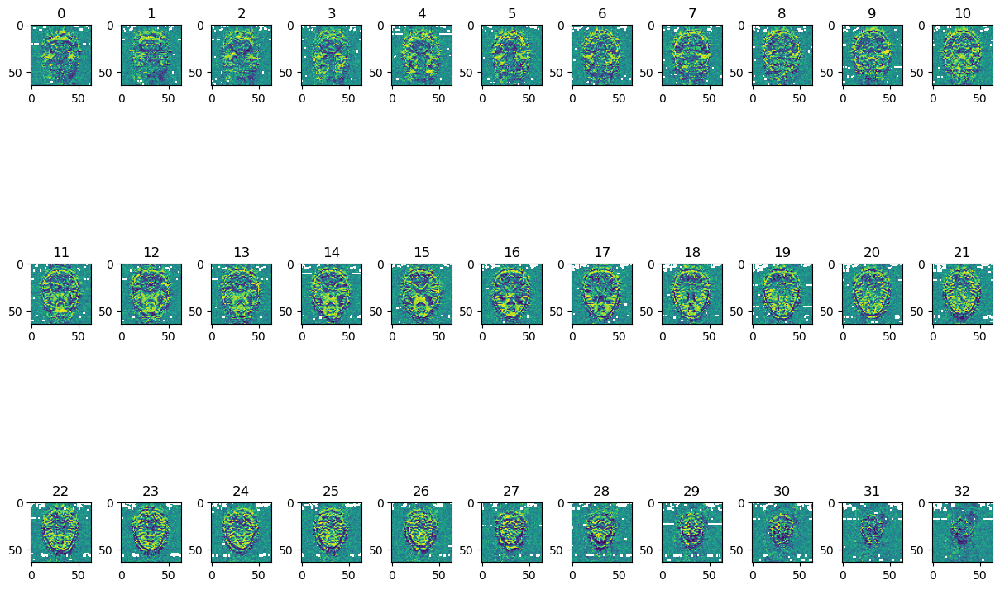

In [27]:
#correlate with bold
#gamma
                                  #RUSSEL-gamma
import nibabel as nib
bold_r1=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/retino_gamma_02.nii.gz").get_fdata()
#creating an empty 4d array
gamma_4d_r=np.zeros(bold_r1.shape)
gamma_4d_r=gamma_4d_r[:,:,:,0:shift_gamma_r.shape[0]]+shift_gamma_r
timepoints=np.arange(30,450)
mean_bold_r = np.mean(bold_r1, axis=3, keepdims=True)
mean_gamma4d_r = np.mean(gamma_4d_r, axis=3, keepdims=True)

numerator_r1 = np.sum((bold_r1[:, :, :, timepoints] - mean_bold_r) * (gamma_4d_r[:, :, :, timepoints] - mean_gamma4d_r), axis=3)
denominator_r1 = np.sqrt(np.sum((bold_r1[:, :, :, timepoints] - mean_bold_r) ** 2, axis=3)) * np.sqrt(np.sum((gamma_4d_r[:, :, :, timepoints] - mean_gamma4d_r) ** 2, axis=3))

corrmap_russ_rest_gamma = numerator_r1 / denominator_r1
    
fig, axes = plt.subplots(3, 11, figsize=(15, 10))  # Adjust the width and height as desired

for i in np.arange(0, 33):
    ax = axes[i // 11, i % 11]
    ax.imshow(np.rot90(corrmap_russ_rest_gamma[:, :, i]), vmin=-0.3, vmax=0.3)
    ax.set_title(i)

plt.subplots_adjust(hspace=0.5, wspace=0.5)  # Adjust the horizontal and vertical spacing
plt.show()

In [28]:
import nibabel as nib
mean_bold_a=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/retino_gamma_02.nii.gz")
cmap_a=nib.Nifti1Image(corrmap_alex_rest_a,mean_bold_a.affine,mean_bold_a.header)
nib.save(cmap_a,'C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/corrmap_alex_retino_2.nii.gz')

mean_bold_g=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/retino_gamma_02.nii.gz")
cmap_g=nib.Nifti1Image(corrmap_gen_rest_alpha,mean_bold_g.affine,mean_bold_g.header)
nib.save(cmap_g,'C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/corrmap_gen_retino_2.nii.gz')

mean_bold_r=nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/retino_gamma_02.nii.gz")
cmap_r=nib.Nifti1Image(corrmap_russ_rest_alpha,mean_bold_r.affine,mean_bold_r.header)
nib.save(cmap_r,'C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/corrmap_russ_retino_2.nii.gz')

In [29]:
t1_alex = nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/alex/t1.nii.gz").get_fdata()
t1_gen = nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/genevieve/t1.nii.gz").get_fdata()
t1_russ = nib.load("C:/Users/nikhi/OneDrive/Desktop/Assignment 3/eegfmri/russell/t1.nii.gz").get_fdata()


In [31]:
average_corr_map_retino_2_alpha=np.mean([corrmap_alex_rest_a,corrmap_gen_rest_alpha,corrmap_russ_rest_alpha],axis=0)
average_corr_map_retino_2_alpha.shape
t1_alex.shape

(240, 240, 150)

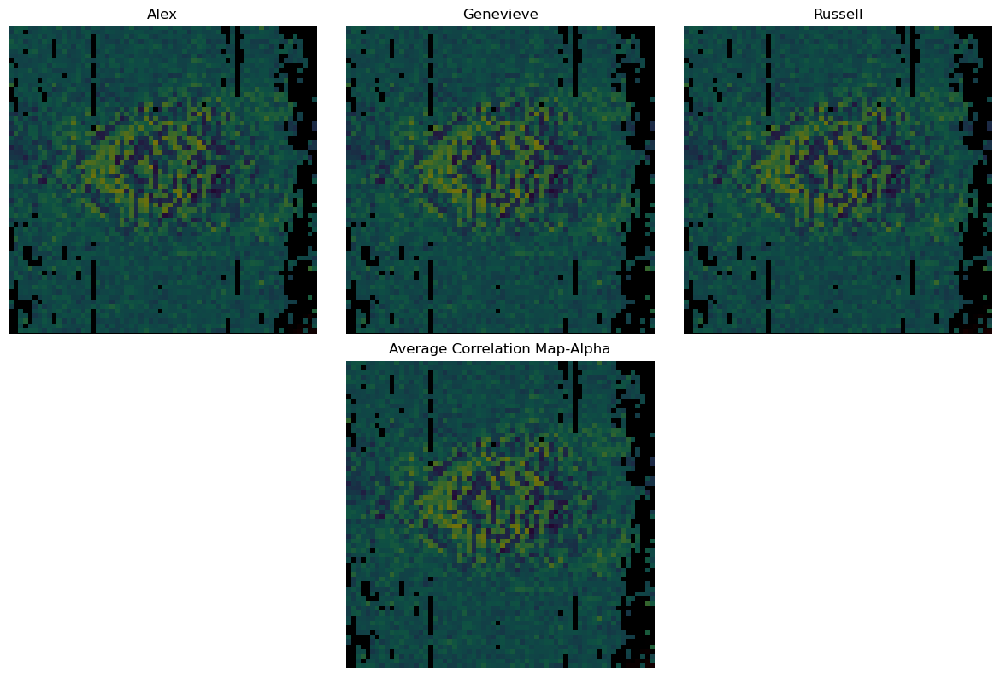

In [32]:
plt.figure(figsize=(12, 8))

# Subject 1: Alex
plt.subplot(231)
plt.imshow(t1_alex[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_alpha[:, :, 30], cmap='viridis', alpha=0.5)
plt.title('Alex')
plt.axis('off')

# Subject 2: Genevieve
plt.subplot(232)
plt.imshow(t1_gen[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_alpha[:, :, 30], cmap='viridis', alpha=0.5)
plt.title('Genevieve')
plt.axis('off')

# Subject 3: Russell
plt.subplot(233)
plt.imshow(t1_russ[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_alpha[:, :, 30], cmap='viridis', alpha=0.5)
plt.title('Russell')
plt.axis('off')

# Average
plt.subplot(212)
plt.imshow(np.mean([t1_alex, t1_gen, t1_russ], axis=0)[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_alpha[:, :, 30], cmap='viridis', alpha=0.5)
plt.title('Average Correlation Map-Alpha')
plt.axis('off')

plt.tight_layout()
plt.show()


In [33]:
average_corr_map_retino_2_gamma=np.mean([corrmap_alex_rest_a,corrmap_gen_rest_alpha,corrmap_russ_rest_alpha],axis=0)
average_corr_map_retino_2_gamma.shape
t1_alex.shape

(240, 240, 150)

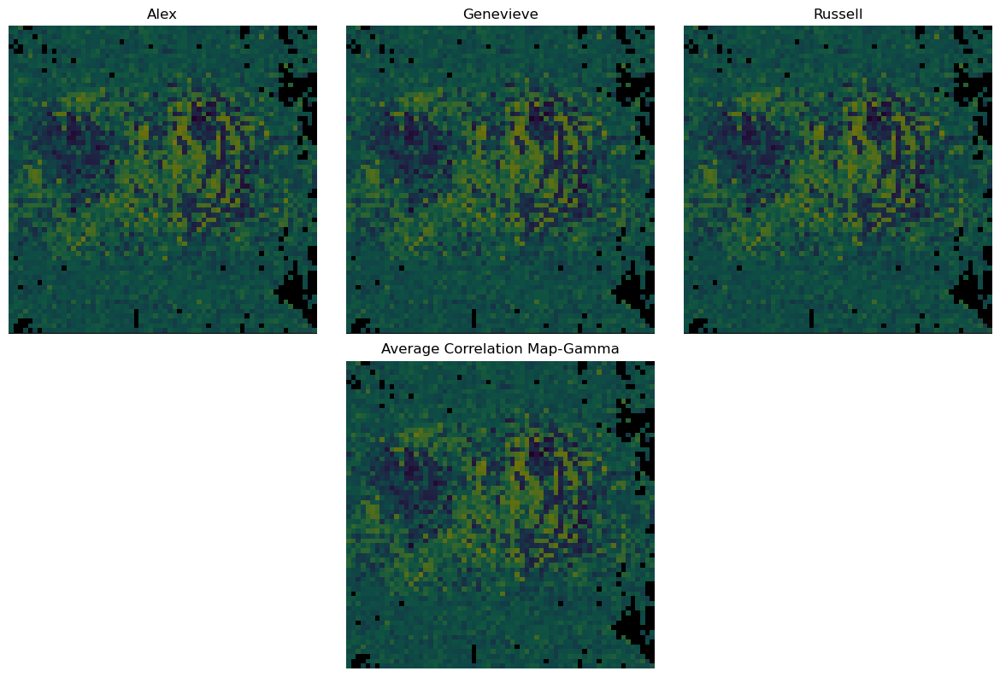

In [35]:
plt.figure(figsize=(12, 8))

# Subject 1: Alex
plt.subplot(231)
plt.imshow(t1_alex[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_gamma[:, :, 3], cmap='viridis', alpha=0.5)
plt.title('Alex')
plt.axis('off')

# Subject 2: Genevieve
plt.subplot(232)
plt.imshow(t1_gen[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_gamma[:, :, 3], cmap='viridis', alpha=0.5)
plt.title('Genevieve')
plt.axis('off')

# Subject 3: Russell
plt.subplot(233)
plt.imshow(t1_russ[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_gamma[:, :, 3], cmap='viridis', alpha=0.5)
plt.title('Russell')
plt.axis('off')

# Average
plt.subplot(212)
plt.imshow(np.mean([t1_alex, t1_gen, t1_russ], axis=0)[:, :, 100], cmap='gist_heat')
plt.imshow(average_corr_map_retino_2_gamma[:, :, 3], cmap='viridis', alpha=0.5)
plt.title('Average Correlation Map-Gamma')
plt.axis('off')

plt.tight_layout()
plt.show()
